Name- Albin Devasia <br>
StudentID- 20321603  <Br>

---


Email - st20321603@outlook.cardiffmet.ac.uk   <Br>
Github Repo-  https://github.com/iamalbyy0/Monster  <Br>
Application Link- https://appapppy-bsequyfnkgkhmqclahdjyk.streamlit.app/

#                                DATA ANALYSIS  OF  AIR  QUALITY


In [4]:
# Importing necessary library files to perform data analysis and visualization

import os
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import plotly.express as px
import streamlit as st



In [ ]:
#  username = "iamalbyy0"
# github = https://github.com/iamalbyy0/Monster

In [5]:

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [6]:
cd /content/drive/MyDrive/Colab\ Notebooks/Project

/content/drive/MyDrive/Colab Notebooks/Project


In [7]:

ls

cleaned_data.csv
PRSA_Data_Dongsi_20130301-20170228.csv
PRSA_Data_Huairou_20130301-20170228.csv
PRSA_Data_Nongzhanguan_20130301-20170228.csv
PRSA_Data_Shunyi_20130301-20170228.csv


## **`Step  1. INSTALL  LIBRARY  PACKAGES**


In [9]:
#  pip install streamlit
#  pip install pandas
#  %cd /content/drive/MyDrive/Colab\ Notebooks/Project
#  ls

#  Reading data files
# dongsi = pd.read_csv('/content/drive/MyDrive/Data/Dongsi.csv')
# dingling = pd.read_csv('/content/drive/MyDrive/Data/Dingling.csv')
# changping = pd.read_csv('/content/drive/MyDrive/Data/Changping.csv')
# aotizhongxin = pd.read_csv('/content/drive/MyDrive/Data/Aotizhongxin.csv')

       #  'urban': pd.read_csv("Dongsi.csv"),
       # 'suburban': pd.read_csv("Changping.csv"),
       #'rural': pd.read_csv( "Dingling.csv"),
       # 'industrial': pd.read_csv( "Aotizhongxin.csv")

       #  To find the total rows and columns of the file
#  df1.shape
#  To list the column names in the file
#  df1.columns

#  # To merge all the data files as a single file
#  merged = d.concat([df1,df2,df3,df4], axis =0)


#  with open("/content/drive/MyDrive/Colab Notebooks/Project/merged_df3", "w") as f:
#    df3.to_csv(f, index=False)


#  merged.to_csv('merged_data.csv', index =False)

#  To save in "Projects" folder
#  save_path = '/content/drive/MyDrive/Colab Notebooks/Project'

  # Run  merged_dataset and reterive rows of data

data = pd.read_csv("//content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv")
data.head()


,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013,3,1,0,9.0,9.0,3.0,17.0000,300.0,89.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Dongsi
1,2013,3,1,1,4.0,4.0,3.0,16.0000,300.0,88.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Dongsi
2,2013,3,1,2,7.0,7.0,7.0,17.0000,300.0,60.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Dongsi
3,2013,3,1,3,3.0,3.0,5.0,18.0000,900.0,46.0,-1.4,1026.2,-25.5,0.0,N,4.9,Dongsi
4,2013,3,1,4,3.0,3.0,7.0,39.6229,200.0,84.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Dongsi


### [STEP 2. **DATA** **PREPROCESSING**]

In [11]:
#  removes the column 'No'
#data.drop('No', axis=1, inplace=True)


In [12]:
# total number of elements in the DataFrame
total_cells = data.size
print(total_cells)

2384352


In [13]:
print(f"Shape: {data.shape}")  #view total rows and columns after merging
print(data.dtypes)  #to list the data types of each columns
print(data.isnull().sum())  #to find total missing columns or cells

Shape: (140256, 17)
year         int64
month        int64
day          int64
hour         int64
PM2.5      float64
PM10       float64
SO2        float64
NO2        float64
CO         float64
O3         float64
TEMP       float64
PRES       float64
DEWP       float64
RAIN       float64
wd          object
WSPM       float64
station     object
dtype: object
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64


In [15]:
# Fill missing values of  PM2.5 with median
#data['PM2.5'] = data['PM2.5'].fillna(data['PM2.5'].median())  # No inplace=True here



In [17]:
# Fill numeric columns with median
#numeric_cols = data.select_dtypes(include=[np.number]).columns
#data[numeric_cols] = data[numeric_cols].fillna(data[numeric_cols].median())



In [19]:
# Fill missing values in categorical columns with the mode (safely)
#categorical_cols = data.select_dtypes(include=['object']).columns
#for col in categorical_cols:
#    mode_vals = data[col].mode()
#    if len(mode_vals) > 0:
#       data[col] = data[col].fillna(mode_vals[0])  # or use mode_vals[1] with safety check


In [20]:
# prints total null values in each column
print(data.isnull().sum())


year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64


In [21]:
#  Check to view Duplicates values
print("Number of duplicates:", data.duplicated().sum())


Number of duplicates: 0


In [23]:
# Drop duplicate values
#data = data.drop_duplicates()

In [25]:
#To identify  outliers in the 'PM 2.5' column using the Interquartile Range (IQR) method

# Select the target column
column = 'PM2.5'

# Calculate quartiles
Q1 = data[column].quantile(0.25)  # 25th percentile
Q3 = data[column].quantile(0.75)  # 75th percentile
IQR = Q3 - Q1

# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"{column} IQR outlier detection:")
print(f"Q1 (25th percentile): {Q1}")
print(f"Q3 (75th percentile): {Q3}")
print(f"IQR: {IQR}")
print(f"Lower bound: {lower_bound}")
print(f"Upper bound: {upper_bound}")


PM2.5 IQR outlier detection:
Q1 (25th percentile): 21.0
Q3 (75th percentile): 109.0
IQR: 88.0
Lower bound: -111.0
Upper bound: 241.0


In [26]:
# Total number of cells
total_cells = data.size

# Total missing values
total_missing = data.isnull().sum().sum()

# Calculate percentage
percent_missing = (total_missing / total_cells) * 100

# Print result
print(f"Percentage of missing values is {percent_missing:.2f}%")

Percentage of missing values is 0.00%


In [27]:
# Initial inspection
def initial_inspection(data):
    print("Data shape:", data.shape)

    print(data.head())
    print("\nData info:")
    df.info()
    print("\nSummary statistics:")
    print(data.describe(include='all', datetime_is_numeric=True))



In [28]:
# Save cleaned DataFrame to a new CSV file
#data.to_csv("/content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv", index=False)


In [29]:
# calculates and prints the total number of unique staions and displays the count of occurrences for each station
station = data['station'].value_counts()
print(f'Total number of station in the dataset : {len(station)}')
station

Total number of station in the dataset : 4


,count
station,
Dongsi,35064
Huairou,35064
Shunyi,35064
Nongzhanguan,35064


<Axes: xlabel='PM2.5', ylabel='Count'>

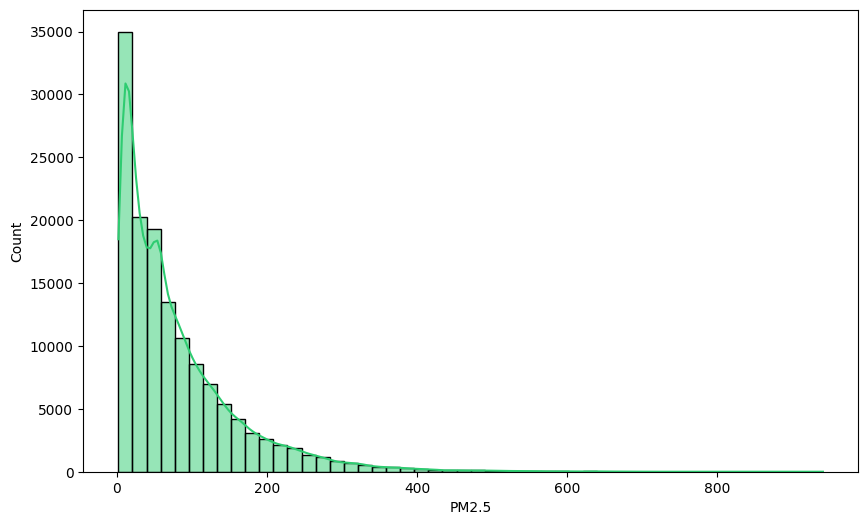

In [30]:
# shows the distribution of the 'PM2.5' pollutant
import matplotlib.pyplot as plt
import seaborn as sns
plt.title
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='PM2.5', bins=50, kde=True, color='#2ecc71')

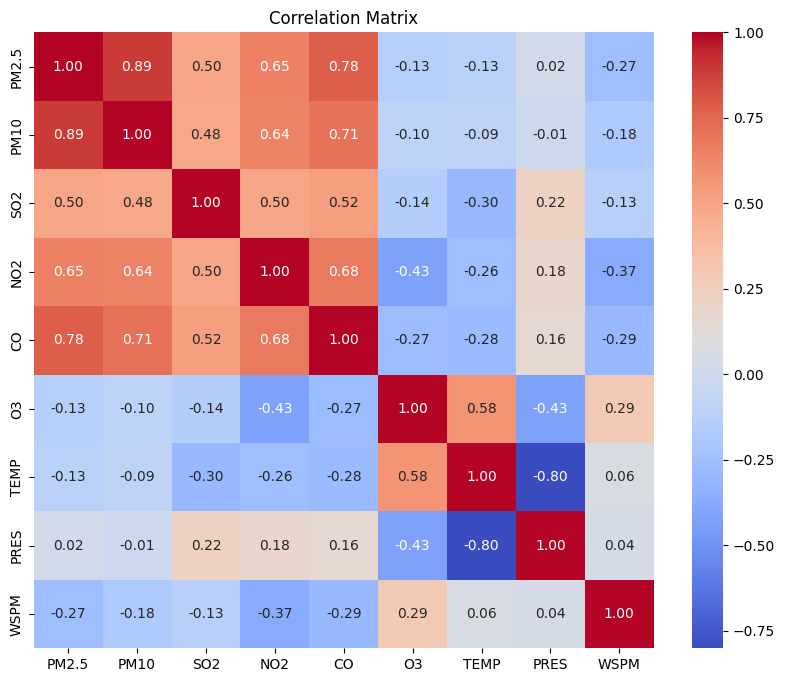

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Recalculate correlation matrix
corr_matrix = data[['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'WSPM']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

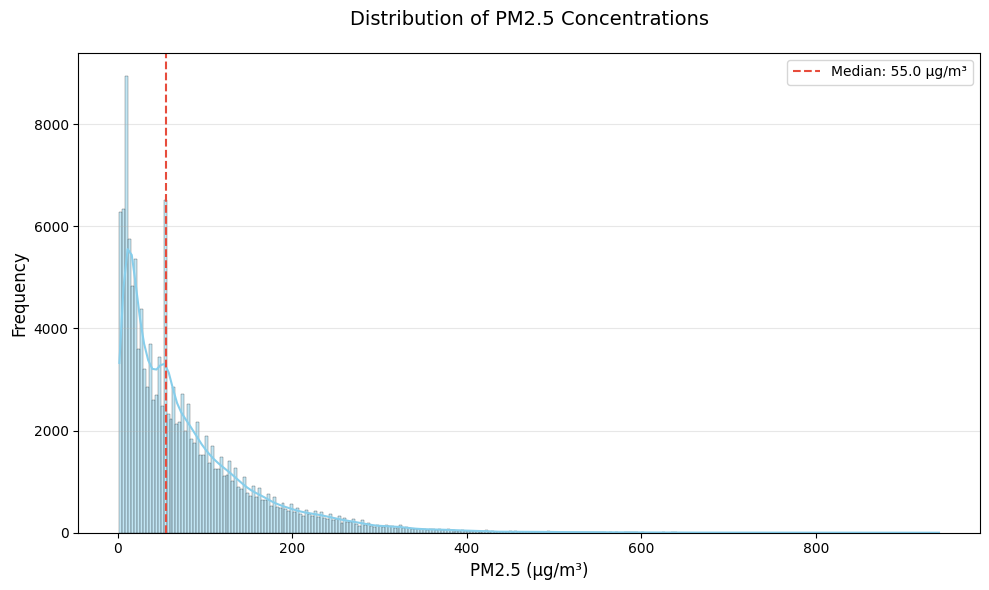

In [32]:
# Generate a histogram with a smooth KDE, and it will clearly highlight the median PM2.5 concentration
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(data['PM2.5'], kde=True, color='skyblue', edgecolor='black')

plt.title('Distribution of PM2.5 Concentrations', fontsize=14, pad=20)
plt.xlabel('PM2.5 (µg/m³)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add vertical line at median
plt.axvline(x=data['PM2.5'].median(), color='#e74c3c', linestyle='--',
            label=f'Median: {data["PM2.5"].median():.1f} µg/m³')

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


# **Univariate Analysis**

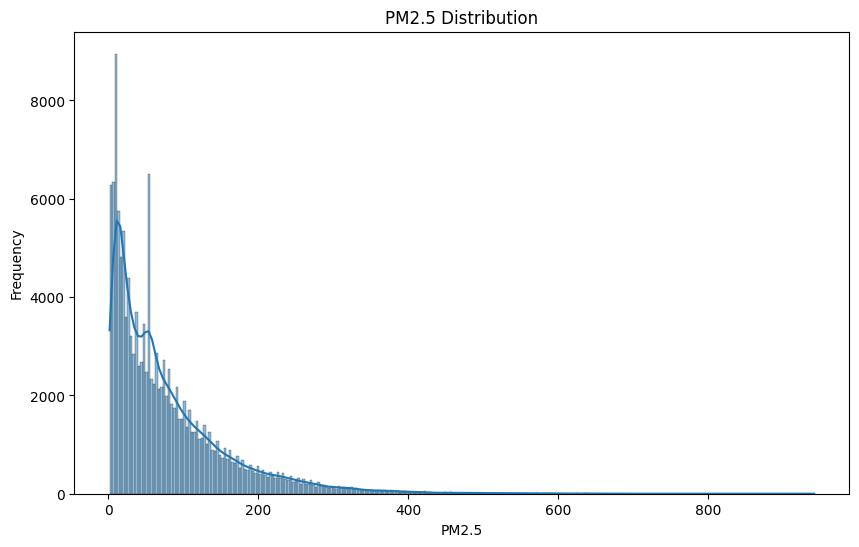

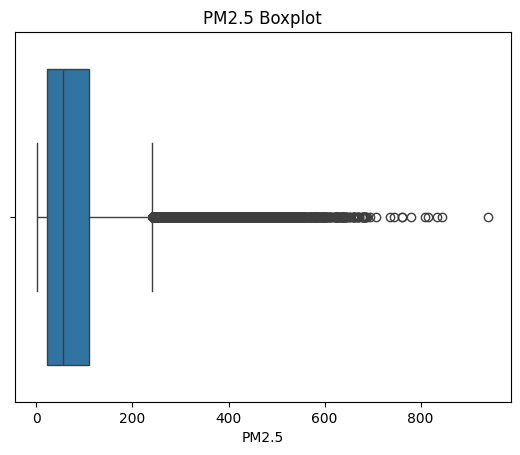

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# PM2.5 distribution
plt.figure(figsize=(10, 6))
data = pd.read_csv("//content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv")
sns.histplot(data['PM2.5'], kde=True)
plt.title('PM2.5 Distribution')
plt.xlabel('PM2.5')
plt.ylabel('Frequency')
plt.show()

# Boxplot for PM2.5 to check for outliers

sns.boxplot(x=data['PM2.5'])
plt.title('PM2.5 Boxplot')
plt.show()


# **Bivariate Analysis** (to understand the relationship between two variables):


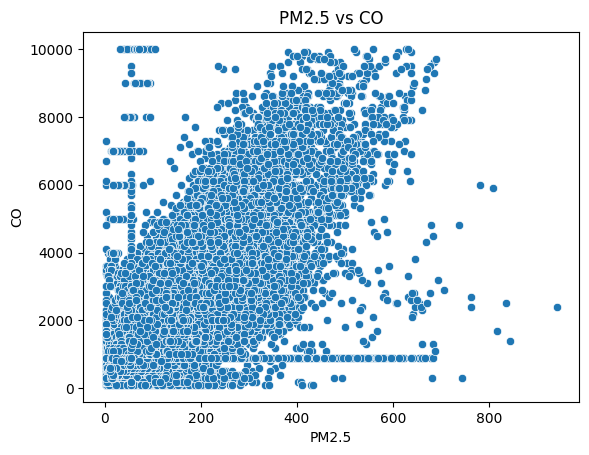

In [35]:
# Scatter plot to check the relationship between PM2.5 and CO
sns.scatterplot(x=data['PM2.5'], y=data['CO'])
plt.title('PM2.5 vs CO')
plt.xlabel('PM2.5')
plt.ylabel('CO')
plt.show()


# **Multivariate Analysis** (for exploring relationships between multiple variables):

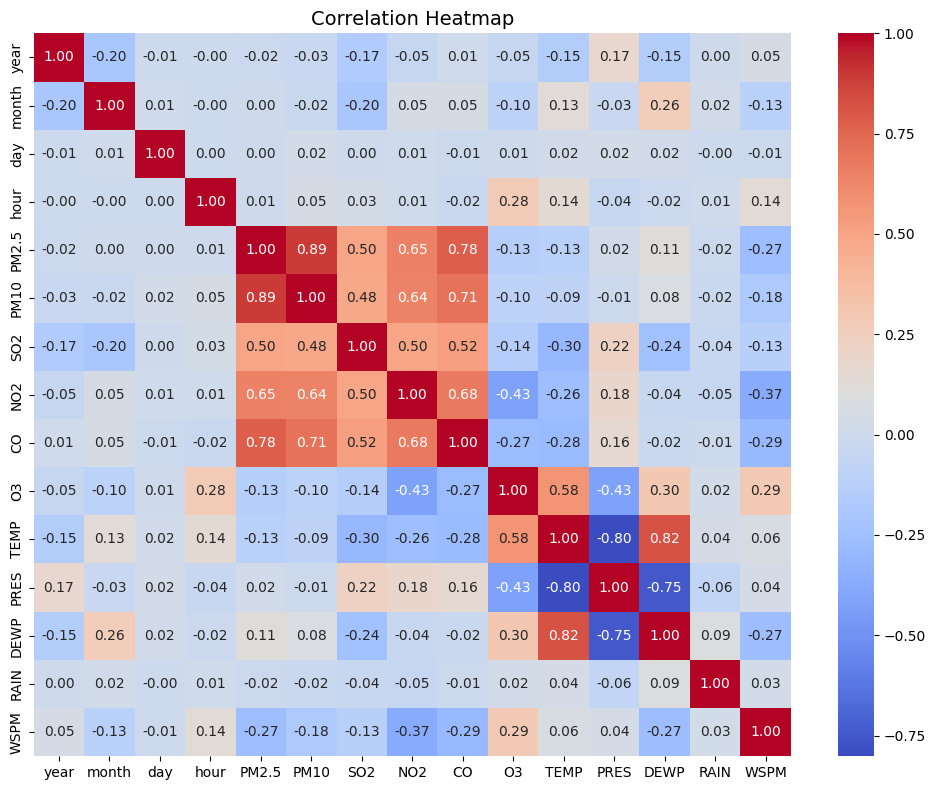

In [36]:

import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlation matrix for numeric columns only
corr_matrix = data.select_dtypes(include=[np.number]).corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap', fontsize=14)
plt.tight_layout()
plt.show()


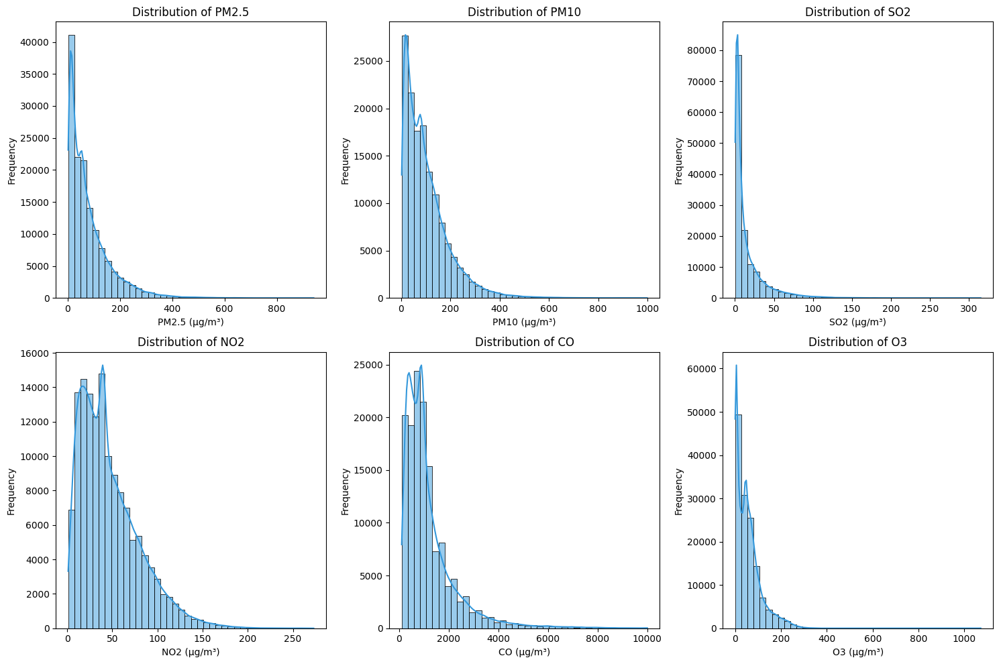

In [37]:
# 2x3 grid of histograms for each pollutants, with each of its distribution and a KDE curve


import matplotlib.pyplot as plt
import seaborn as sns

# Define pollutant columns
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Create 2x3 grid of histograms
plt.figure(figsize=(15, 10))
for i, col in enumerate(pollutants, 1):
    plt.subplot(2, 3, i)
    sns.histplot(data=data, x=col, bins=40, kde=True, color='#3498db')
    plt.title(f'Distribution of {col}')
    plt.xlabel(f'{col} (µg/m³)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


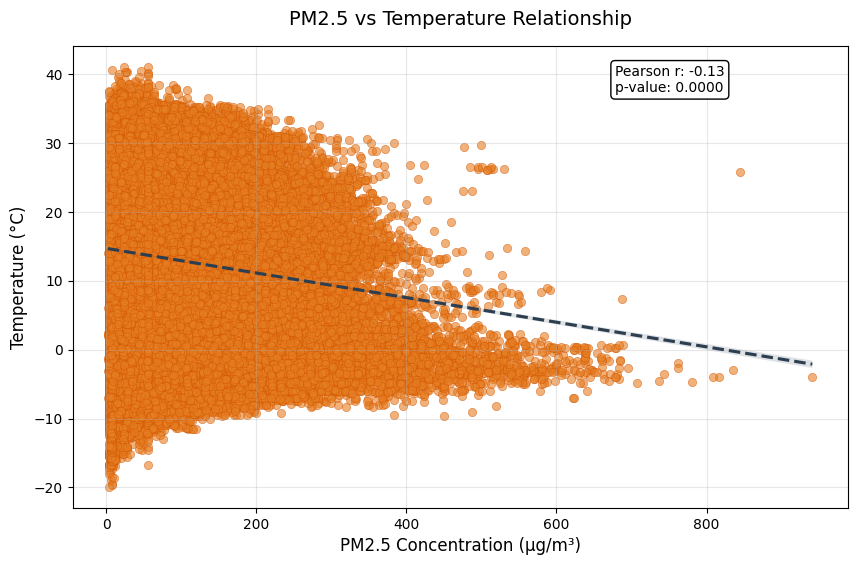

In [38]:
#  Scatter plot with a regression line between the 'PM2.5' and 'TEMP' columns, to
 # calculate and display the Pearson correlation coefficient and p-value on the plot.
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Load data
# df = pd.read_csv('merged_data.csv')

# Scatter plot with regression line
plt.figure(figsize=(10, 6))
ax = sns.scatterplot(data=data, x='PM2.5', y='TEMP',
                    alpha=0.6, color='#e67e22',
                    edgecolor='#d35400')

# Add regression line
sns.regplot(data=data, x='PM2.5', y='TEMP',
           scatter=False, color='#2c3e50',
           line_kws={'linestyle':'--'})


# Drop rows where either PM2.5 or TEMP is missing
subset = data[['PM2.5', 'TEMP']].dropna()

# Calculate Pearson correlation
corr, p_value = pearsonr(subset['PM2.5'], subset['TEMP'])



# Annotate plot
plt.title('PM2.5 vs Temperature Relationship', fontsize=14, pad=15)
plt.xlabel('PM2.5 Concentration (µg/m³)', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.grid(alpha=0.3)
plt.annotate(f'Pearson r: {corr:.2f}\np-value: {p_value:.4f}',
            xy=(0.7, 0.9), xycoords='axes fraction',
            bbox=dict(boxstyle='round', fc='white'))

plt.show()

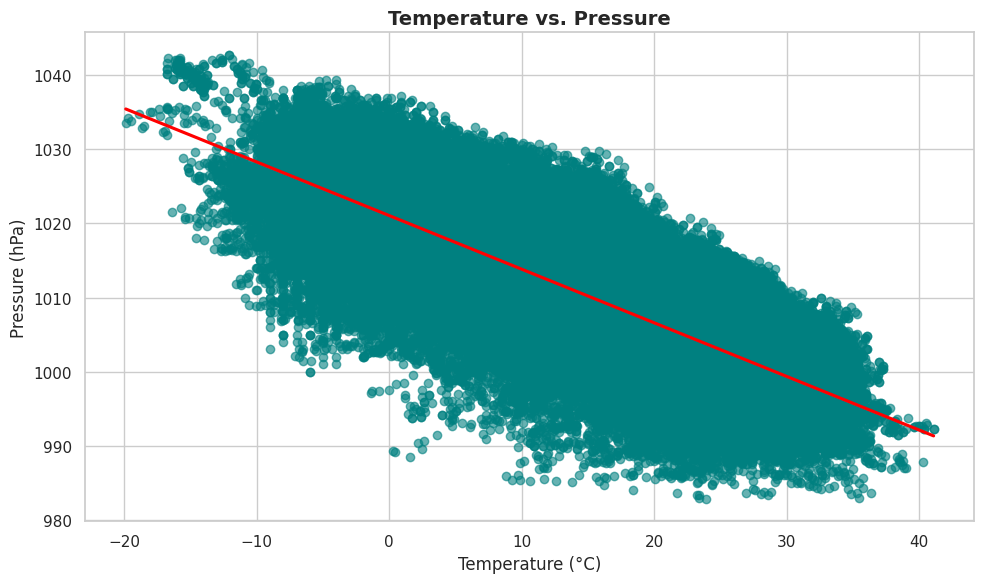

In [40]:

plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

# Scatter plot with regression line
sns.regplot(x='TEMP', y='PRES', data=data, scatter_kws={'alpha':0.6, 'color': 'teal'}, line_kws={'color': 'red'})

plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Pressure (hPa)', fontsize=12)
plt.title('Temperature vs. Pressure', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


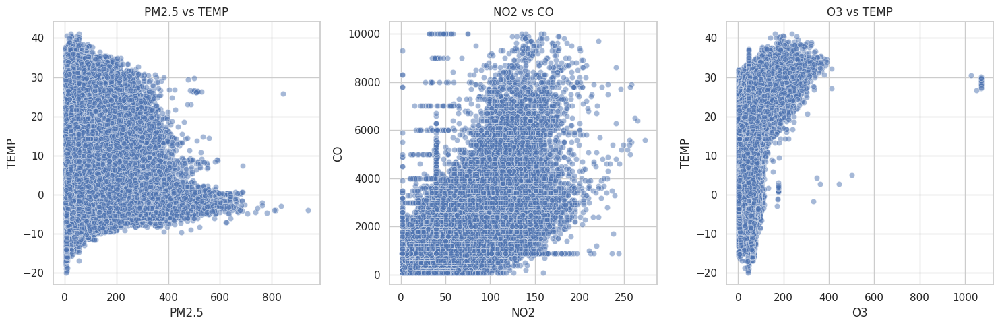

In [41]:
# 1-row, 3-column grid of scatter plots, each displaying the relationship between pollutants(variables)
variables = [('PM2.5', 'TEMP'), ('NO2', 'CO'), ('O3', 'TEMP')]

plt.figure(figsize=(15, 5))
for i, (x_var, y_var) in enumerate(variables, 1):
    plt.subplot(1, 3, i)
    sns.scatterplot(data=data, x=x_var, y=y_var, alpha=0.5)
    plt.title(f'{x_var} vs {y_var}')
    plt.tight_layout()

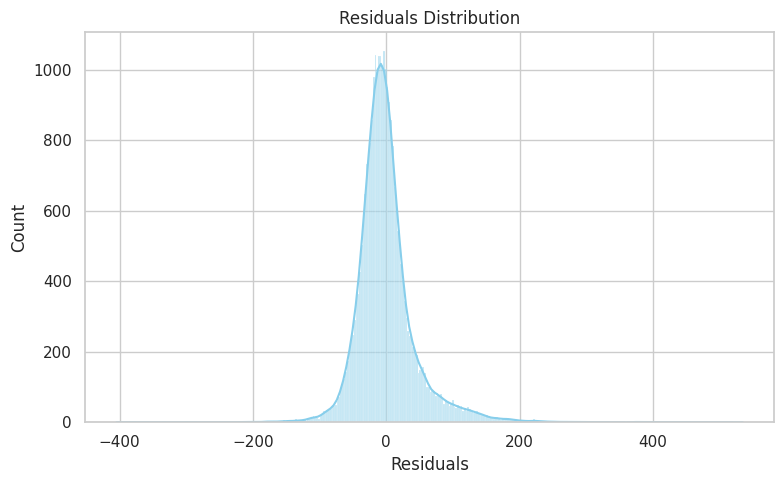

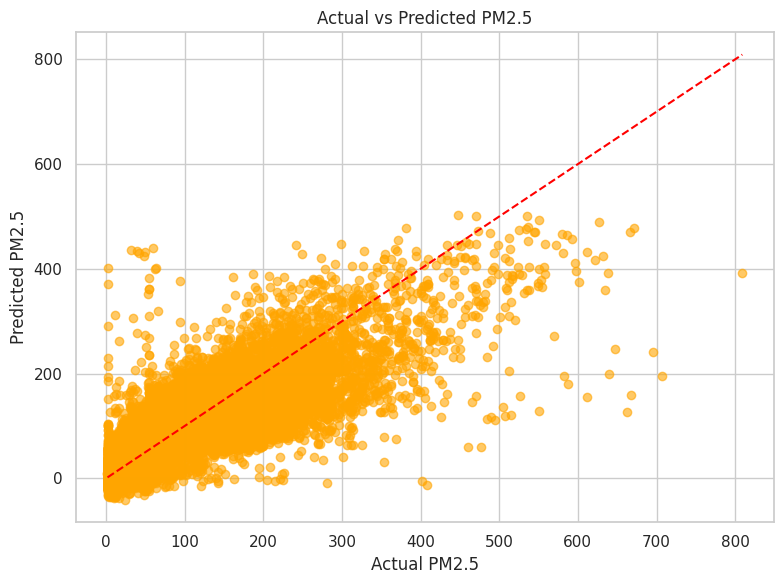

✅ Ridge Regression CV RMSE: 45.94

🌲 Random Forest Evaluation:
• RMSE: 31.32
• R² Score: 0.85


In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
from math import sqrt
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import mean_squared_error, r2_score

# Load your dataset
data = pd.read_csv("//content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv")

# Select features and target
features = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'SO2', 'NO2', 'CO', 'O3', 'wd']
target = 'PM2.5'

# Drop missing values
data = data.dropna(subset=features + [target])
X = data[features]
y = data[target]

# Identify column types
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
numerical_features = X.select_dtypes(exclude=['object']).columns.tolist()

# Define preprocessing
preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), numerical_features),
    ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge Pipeline
ridge_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('ridge', Ridge(alpha=1.0))
])

ridge_pipeline.fit(X_train, y_train)
y_pred = ridge_pipeline.predict(X_test)

# Residuals
residuals = y_test - y_pred

# Plot Residuals Distribution
plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, color='skyblue')
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.tight_layout()
plt.show()

# Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='orange')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='red')
plt.xlabel('Actual PM2.5')
plt.ylabel('Predicted PM2.5')
plt.title('Actual vs Predicted PM2.5')
plt.tight_layout()
plt.show()

# Cross-validation RMSE (on scaled data)
X_processed = preprocessor.fit_transform(X)
cv_scores = cross_val_score(Ridge(alpha=1.0), X_processed, y, cv=5, scoring='neg_mean_squared_error')
rmse_cv = (-cv_scores.mean())**0.5
print(f"✅ Ridge Regression CV RMSE: {rmse_cv:.2f}")

# Random Forest (no need for scaling, but still use encoded features)
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42))
])

rf_pipeline.fit(X_train, y_train)
y_pred_rf = rf_pipeline.predict(X_test)

rmse_rf = sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

print("\n🌲 Random Forest Evaluation:")
print(f"• RMSE: {rmse_rf:.2f}")
print(f"• R² Score: {r2_rf:.2f}")


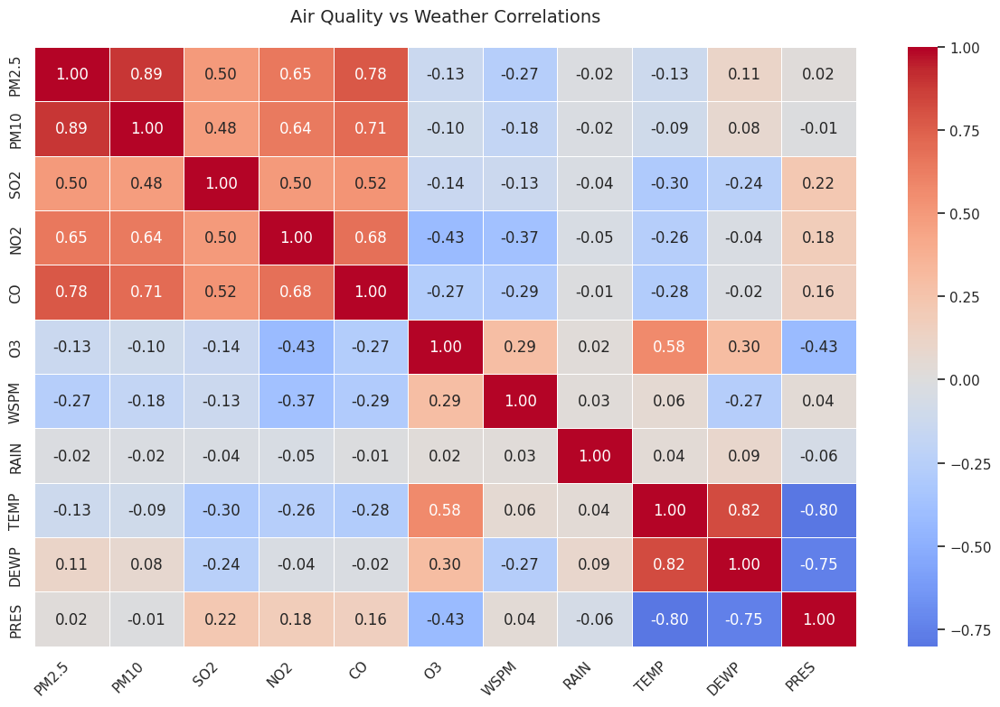

In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns
columns_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3',
                       'WSPM', 'RAIN', 'TEMP', 'DEWP', 'PRES']
data_subset = data[columns_of_interest]

# Calculate correlation matrix
corr_matrix = data_subset.corr()

# Generate heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix,
           annot=True,
           cmap='coolwarm',
           center=0,
           fmt=".2f",
           linewidths=0.5)
plt.title("Air Quality vs Weather Correlations", pad=20, fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


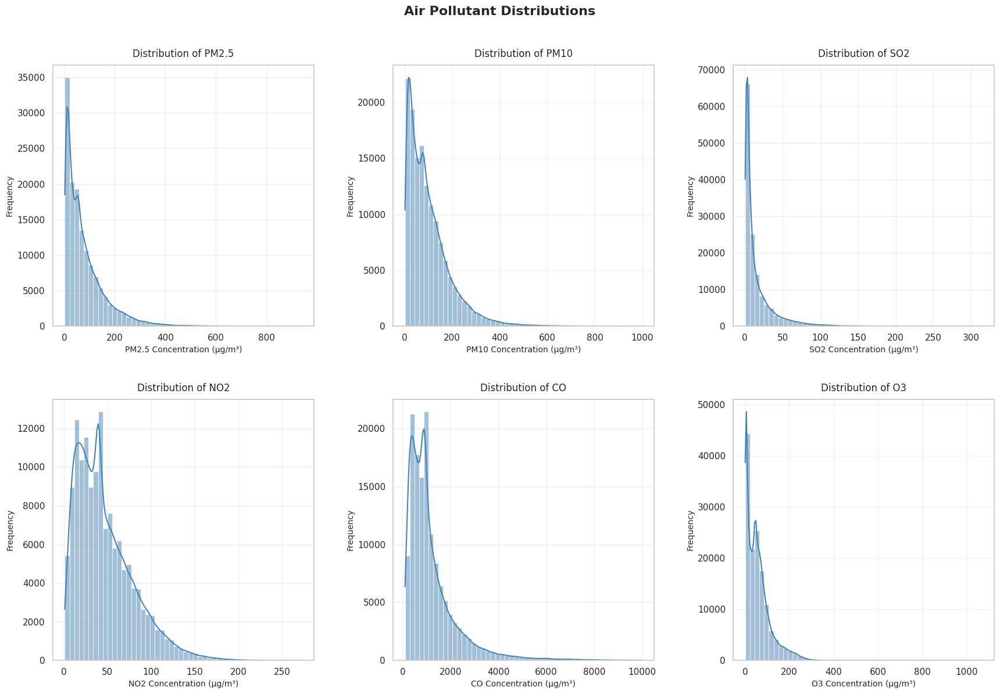

In [46]:
# 2x3 grid of histograms to visualize the distribution of air pollutants (PM2.5, PM10, SO2, NO2, CO, and O3) with kernel density estimation (KDE)
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure and subplots
plt.figure(figsize=(18, 12))
sns.set_style("whitegrid")

# List of pollutants
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Create 2x3 grid of subplots
for i, col in enumerate(pollutants, 1):
    plt.subplot(2, 3, i)
    sns.histplot(data[col], bins=50, kde=True, color='steelblue')
    plt.title(f'Distribution of {col}', fontsize=12, pad=10)
    plt.xlabel(f'{col} Concentration (µg/m³)', fontsize=10)
    plt.ylabel('Frequency', fontsize=10)
    plt.grid(alpha=0.3)

plt.tight_layout(pad=3.0)
plt.suptitle('Air Pollutant Distributions', y=1.02, fontsize=16, fontweight='bold')
plt.show()

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns

pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Create 2x3 subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10), constrained_layout=True))
fig.suptitle('Distributions of Air Pollutants', fontsize=16, y=1.02)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot each pollutant
for i, col in enumerate(pollutants):
    sns.histplot(data[col], bins=50, kde=True, ax=axes[i], color='#3498db')
    axes[i].set_title(f'{col} Distribution')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()
import matplotlib.pyplot as plt
import seaborn as sns

pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Create 2x3 subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Distributions of Air Pollutants', fontsize=16, y=1.02)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot each pollutant
for i, col in enumerate(pollutants):
    sns.histplot(data[col], bins=50, kde=True, ax=axes[i], color='#3498db')
    axes[i].set_title(f'{col} Distribution')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


SyntaxError: unmatched ')' (<ipython-input-101-35aef9f4e013>, line 7)

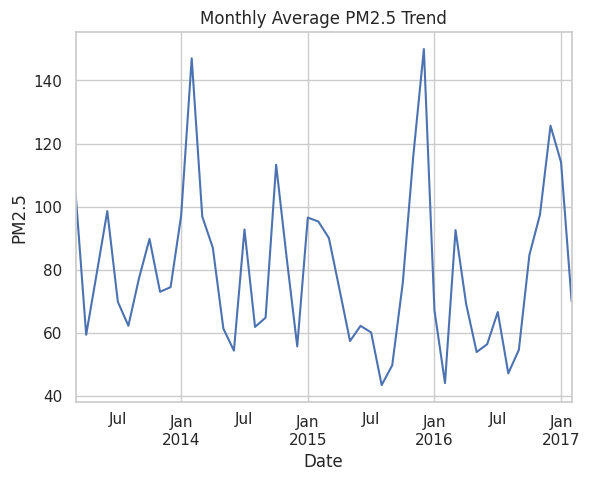

In [48]:
#  view datetime index from the year, month, day, and hour columns in the DataFrame, and then resample the data to calculate the monthly average of PM2.5 concentrations.
data['datetime'] = pd.to_datetime(data[['year', 'month', 'day', 'hour']])
data.set_index('datetime', inplace=True)

#
data['PM2.5'].resample('ME').mean().plot()  # Use 'ME' instead of 'M' to avoid FutureWarning
plt.title('Monthly Average PM2.5 Trend')
plt.ylabel('PM2.5')
plt.xlabel('Date')
plt.show()


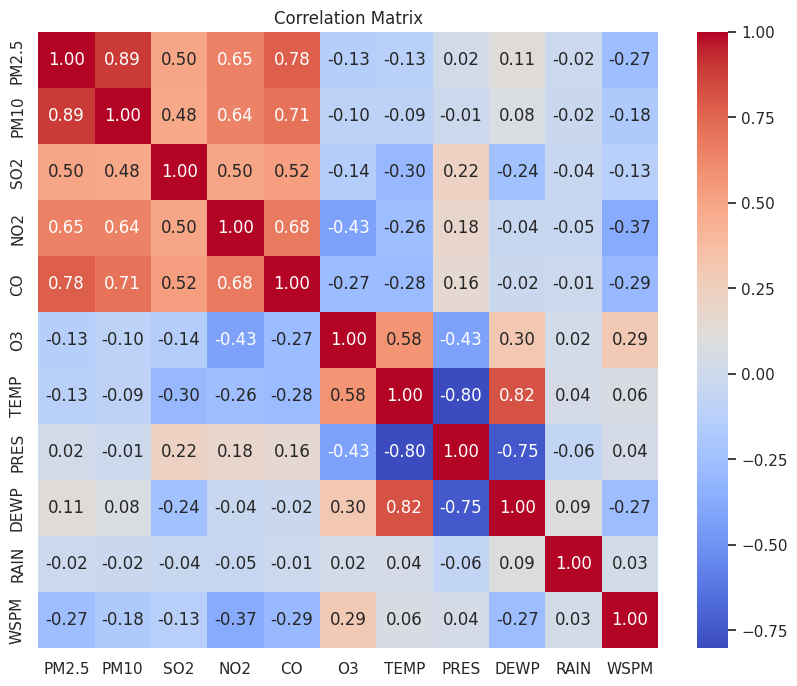

In [45]:
# a heatmap to visualize the correlation matrix of the pollutants along with the weather-related variables
plt.figure(figsize=(10, 8))
sns.heatmap(data[pollutants + ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']].corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [49]:
#creates function show_pollution_plot() that creates an interactive bar plot u to visualize median pollution levels for each pollutant

import pandas as pd
import plotly.express as px

# Assuming 'data' is already a DataFrame loaded with the necessary columns
pollutants = ['PM2.5', 'PM10', 'NO2', 'CO', 'SO2', 'O3']

def show_pollution_plot():
    melted_data = data.melt(value_vars=pollutants,
                            var_name='Pollutant',
                            value_name='Value')

    median_values = melted_data.groupby('Pollutant')['Value'].median().reset_index()

    fig = px.bar(median_values.sort_values('Value'),
                 x='Value',
                 y='Pollutant',
                 orientation='h',
                 title='Median Pollution Levels',
                 labels={'Value': 'Concentration (µg/m³)', 'Pollutant': ''})

    fig.update_layout(yaxis={'categoryorder': 'total ascending'})
    fig.show()

# Call the function to display the plot
show_pollution_plot()



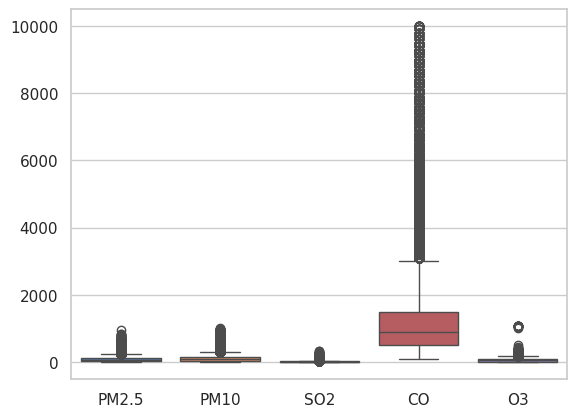

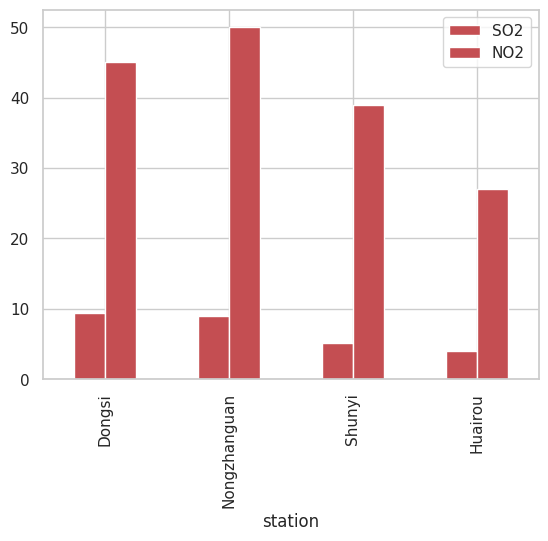

In [50]:
# to understand the distribution and trends in air pollution data
sns.boxplot(data=data[['PM2.5', 'PM10', 'SO2', 'CO', 'O3']])
data[['SO2', 'NO2','station']].groupby(["station"]).median().sort_values(by='SO2',ascending=False).head(10).plot.bar(color='r')
plt.show()

In [51]:
pollutants = ['PM2.5', 'PM10', 'NO2', 'CO', 'SO2', 'O3']

<ipython-input-52-d8a2d99dc4fb>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




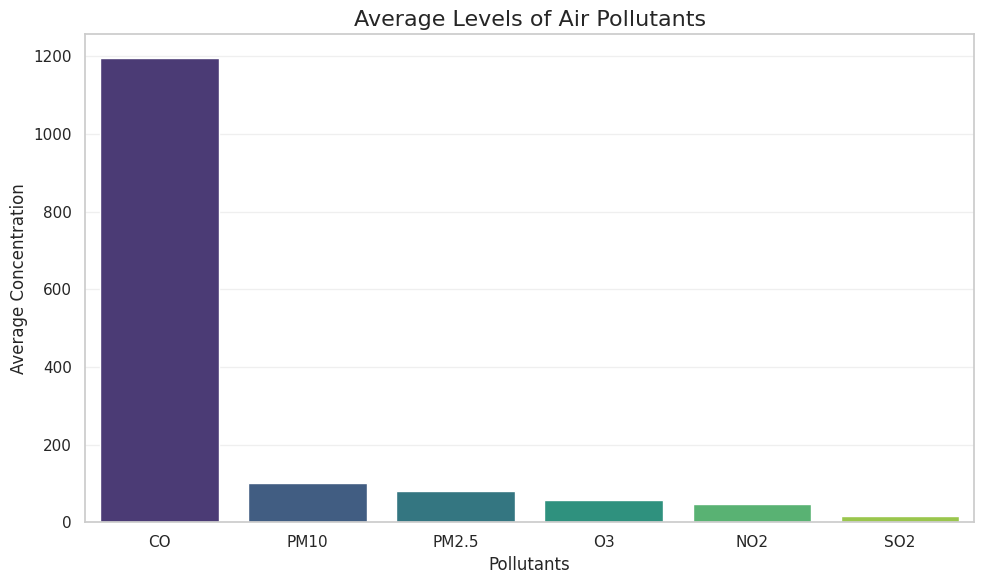

In [52]:
#calculates the average concentration of selected air pollutants and then creates a bar plot to visualize the results
avg_values = data[pollutants].mean().sort_values(ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')
plt.title("Average Levels of Air Pollutants", fontsize=16)
plt.xlabel("Pollutants")
plt.ylabel("Average Concentration")
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

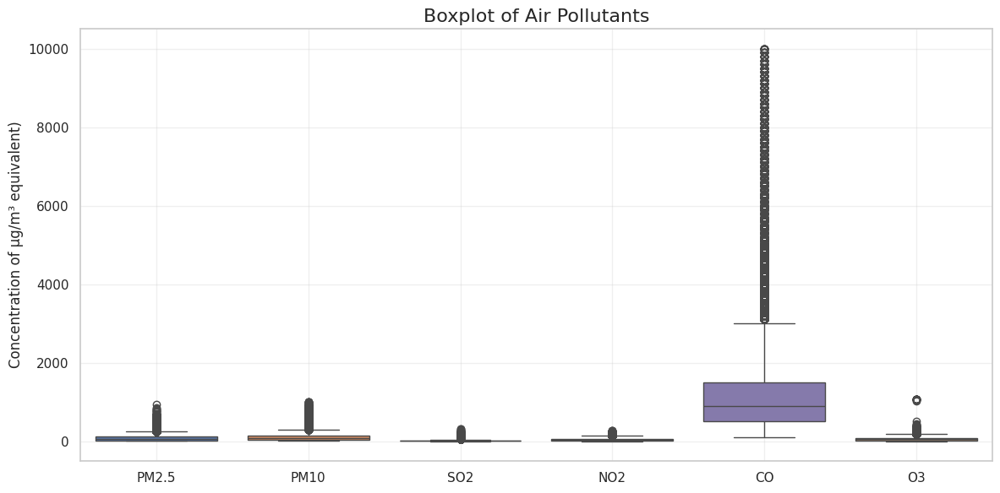

In [53]:
# a boxplot of air pollutants.
plt.figure(figsize=(12, 6))
sns.boxplot(data=data[['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']])
plt.title("Boxplot of Air Pollutants", fontsize=16)
plt.ylabel("Concentration of µg/m³ equivalent)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [54]:
#calculates the mean value for each of the specified pollutants and weather-related variables, then stores the results in a new DataFrame
import pandas as pd

# List of relevant variables
pollutants = ['PM2.5', 'PM10', 'CO', 'SO2','NO2', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Calculate mean for each variable
pol = data[pollutants].mean().reset_index()

# Rename columns
pollutants_data = pol
pollutants_data.columns = ['Pollutant', 'Level']

# Display the result
pollutants_data


,Pollutant,Level
0,PM2.5,79.478467
1,PM10,102.022981
2,CO,1196.857375
3,SO2,15.540293
4,NO2,46.840409
5,O3,57.383408
6,TEMP,13.295279
7,PRES,1011.438930
8,DEWP,2.400332
9,RAIN,0.064201


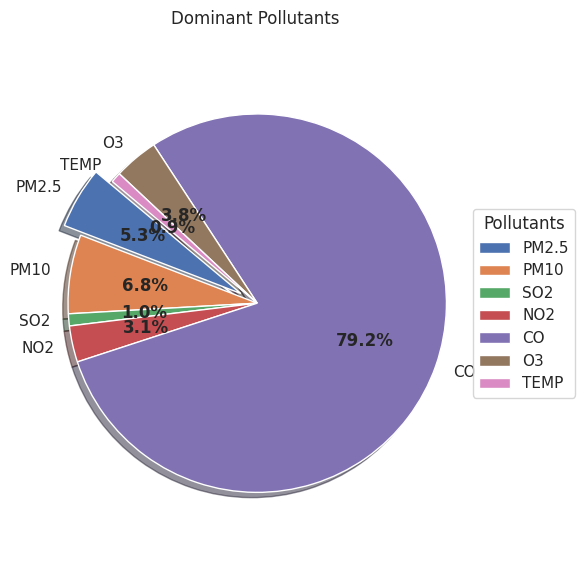

In [55]:
import pandas as pd
import matplotlib.pyplot as plt

# List of pollutants
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP']

# Create DataFrame with mean values
pollutants_data = pd.DataFrame({
    'Pollutant': pollutants,
    'Level': data[pollutants].mean().values
})

# Pie chart setup
labels = pollutants_data['Pollutant']
explode = [0.1] + [0] * (len(pollutants) - 1)  # Explode only the first slice (PM2.5)

plt.figure(figsize=(6, 6))
plt.title('Dominant Pollutants')

# Plot pie chart
wedges, texts, autotexts = plt.pie(
    pollutants_data['Level'],
    explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    shadow=True,
    startangle=140
)

plt.axis('equal')  # Draw as a circle

# Legend
plt.legend(
    wedges,
    labels,
    title="Pollutants",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

# Style percentage texts
plt.setp(autotexts, size=12, weight='bold')

# Show plot
plt.tight_layout()
plt.show()


In [56]:
# process air quality data to determine the dominant pollutant in each station
import pandas as pd

pollutants = ['PM2.5', 'PM10', 'CO', 'SO2', 'O3']

# Group data by 'State' and calculate the mean of each pollutant
statewise_pollution_means = data.groupby('station')[pollutants].mean()

# Find the dominant pollutant in each state
dominant_pollutant_by_state = statewise_pollution_means.idxmax(axis=1)

# Convert the result to a DataFrame for better readability
dominant_pollutant_data = dominant_pollutant_by_state.reset_index()
dominant_pollutant_data.columns = ['station', 'Dominant Pollutant']

# Display the results
dominant_pollutant_data


,station,Dominant Pollutant
0,Dongsi,CO
1,Huairou,CO
2,Nongzhanguan,CO
3,Shunyi,CO


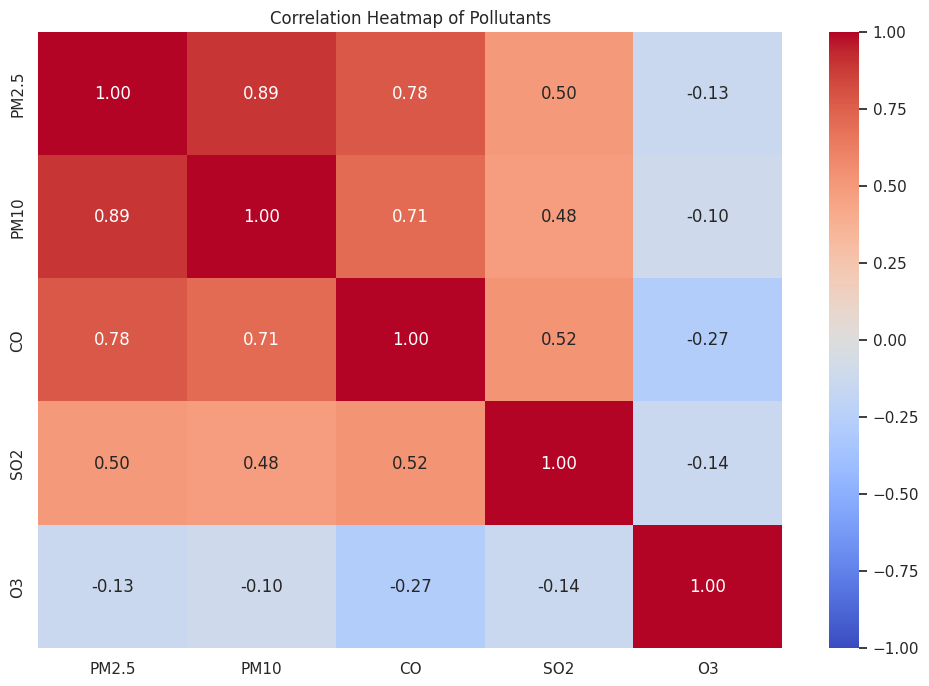

In [57]:
# the correlation between the specified pollutants (PM2.5, PM10, CO, SO2, O3) using a heatmap.
# The correlations help identify how pollutants are related to one another.
# a high positive correlationmeans pollutants tend to increase or decrease together
# while a negative correlation suggests one increases while the other decreases.

pollutants = ['PM2.5', 'PM10', 'CO', 'SO2', 'O3']
numeric_pollutants_df = data[pollutants]

# Convert data to numeric (this will handle any non-numeric values)
numeric_pollutants_data = numeric_pollutants_df.apply(pd.to_numeric, errors='coerce')

# Drop rows with any NaN values (if any)
numeric_pollutants_data = numeric_pollutants_data

# Calculate the correlation matrix
correlation_matrix = numeric_pollutants_data.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Pollutants')
plt.show()

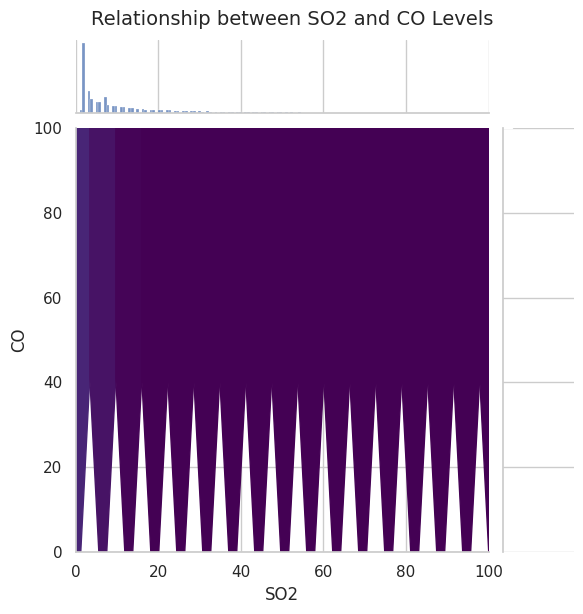

In [58]:
#Exploring relationship between two pollutants SO2 & CO
import seaborn as sns
import matplotlib.pyplot as plt

# Use a perceptible colormap like 'viridis', 'Blues', or 'inferno'
sns.jointplot(
    x='SO2',
    y='CO',
    data=data,
    kind='hex',
    cmap='viridis',  # better color gradient
    xlim=(0, 100),
    ylim=(0, 100)
)

plt.suptitle('Relationship between SO2 and CO Levels', y=1.02, fontsize=14)
plt.show()


In [64]:
print(data.columns)
print(list(data.columns))


Index(['year', 'SO2'], dtype='object')
['year', 'SO2']


<Axes: xlabel='year', ylabel='SO2'>

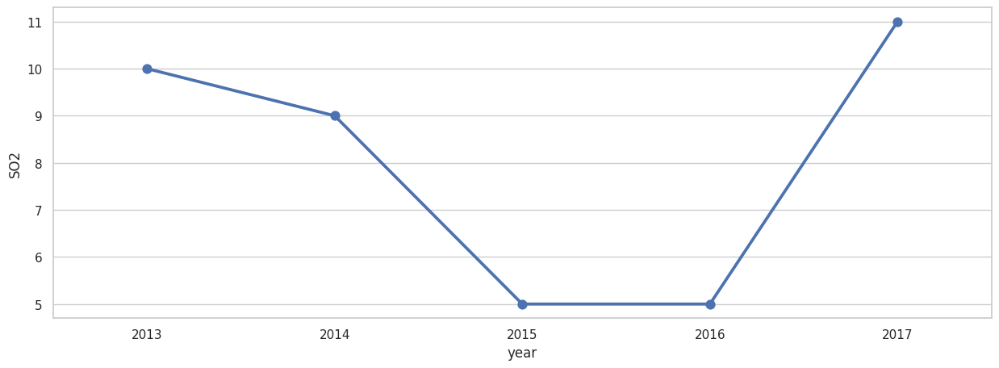

In [59]:
# visualizing the median levels of Sulfur Dioxide (SO) by year
data = data[['SO2','year']].groupby(["year"]).median().reset_index().sort_values(by='year',ascending=False)
f,ax=plt.subplots(figsize=(15,5))
sns.pointplot(x='year', y='SO2', data=data)

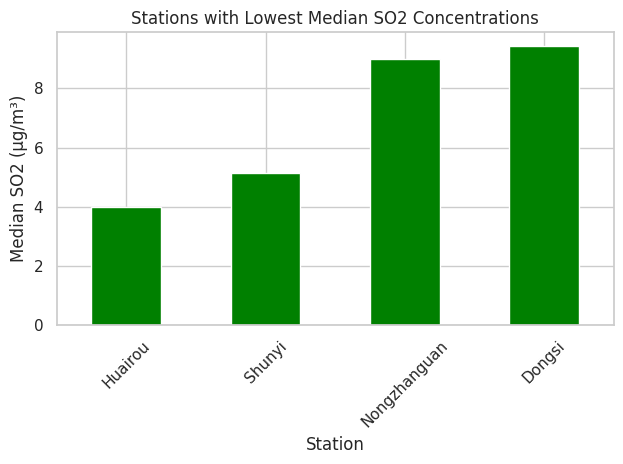

In [72]:
# plotting a bar chart that shows the stations with the lowest median concentrations of Sulfur Dioxide (SO2)

import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv")

# Select only numeric columns and group by station
numeric_cols = data.select_dtypes(include='number').columns.tolist()

# Ensure 'station' is preserved for grouping
if 'station' not in data.columns:
    raise KeyError("'station' column not found in dataset!")

# Combine 'station' with numeric columns
group_data = data[['station'] + numeric_cols]

# Compute median SO2 by station and plot the lowest 10
(
    group_data.groupby('station')
    .median()
    .sort_values(by='SO2', ascending=True)
    .head(10)
    .plot.bar(y='SO2', color='green', legend=False)
)

plt.title('Stations with Lowest Median SO2 Concentrations')
plt.ylabel('Median SO2 (µg/m³)')
plt.xlabel('Station')
plt.xticks(rotation=45)
plt.tight_layout()




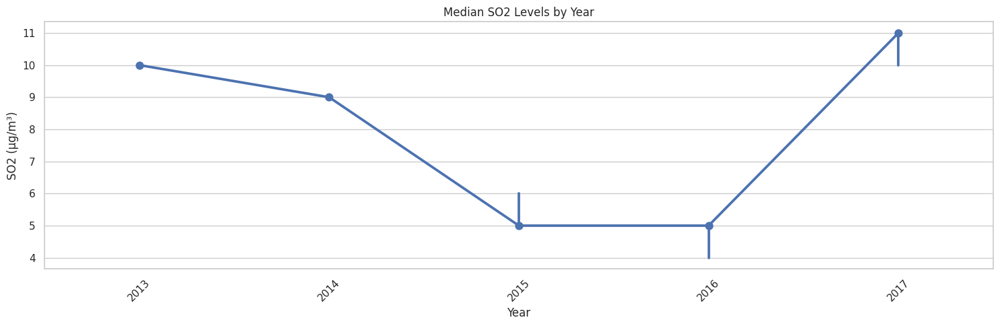

In [75]:
#visualize the relationship between SO2 levels and the year
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 5))
sns.pointplot(x='year', y='SO2', data=data, estimator='median')
plt.title('Median SO2 Levels by Year')
plt.ylabel('SO2 (µg/m³)')
plt.xlabel('Year')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


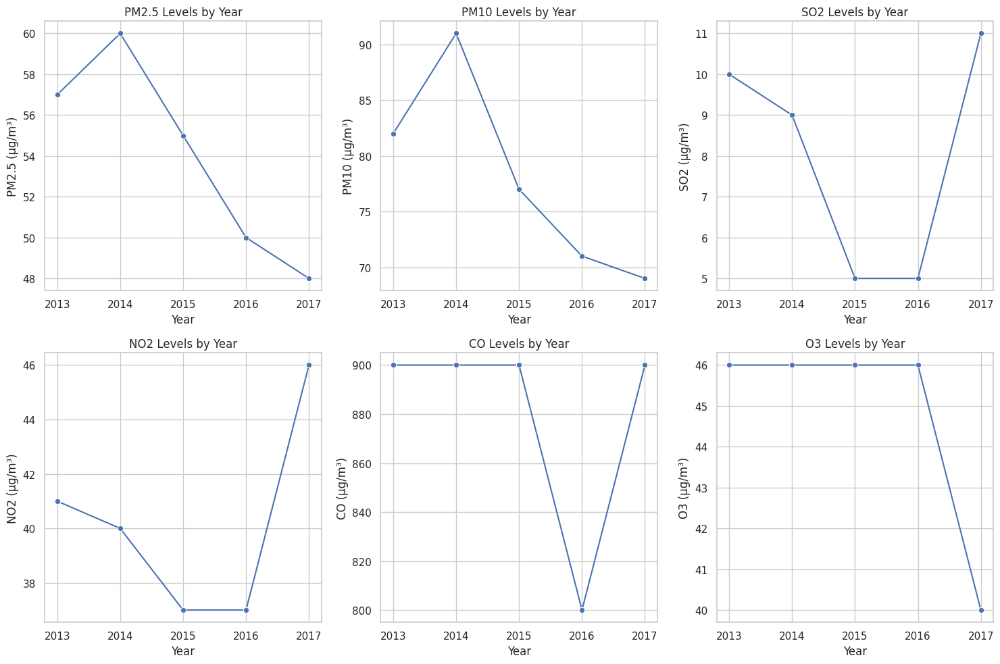

In [77]:
#visualize the relationship between all pollutant levels and the year,
# List of pollutants
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Create a DataFrame to store median values of pollutants by year
yearly_pollutant_medians = data.groupby('year')[pollutants].median().reset_index()

# Plot the relationship between each pollutant and the year
plt.figure(figsize=(15, 10))

# Loop over each pollutant and plot it
for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(2, 3, i)  # Create a 2x3 grid for subplots
    sns.lineplot(x='year', y=pollutant, data=yearly_pollutant_medians, marker='o')
    plt.title(f'{pollutant} Levels by Year')
    plt.xlabel('Year')
    plt.ylabel(f'{pollutant} (µg/m³)')
    plt.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


   day       station      PM2.5        NO2        SO2           CO         O3
0    1        Dongsi  94.444358  52.558054  16.122992  1412.843750  55.146072
1    1       Huairou  80.529080  33.510881  11.074026  1148.519097  54.451457
2    1  Nongzhanguan  91.155295  55.999060  16.196786  1306.499132  56.434007
3    1        Shunyi  88.842014  43.821904  10.945312  1219.782118  49.425648
4    2        Dongsi  79.528125  53.282385  18.143041  1337.920139  53.462581


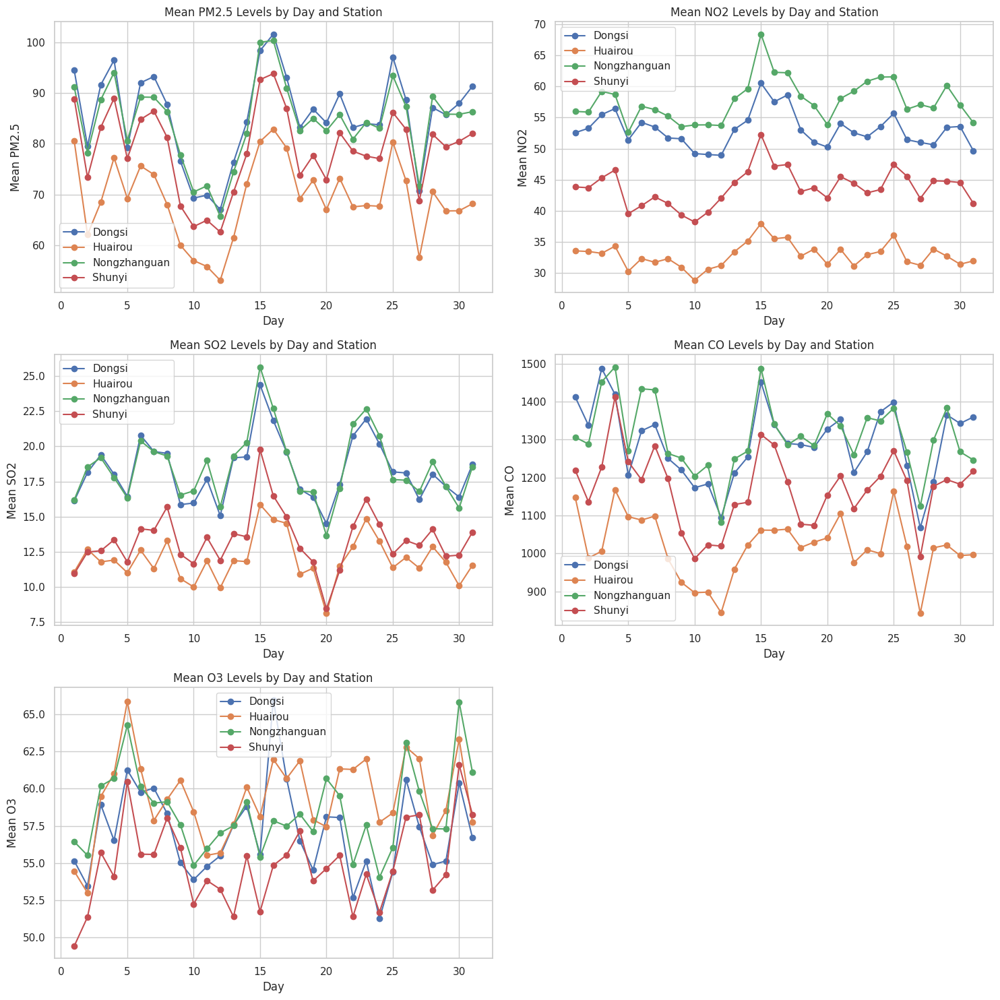

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# Grouping statistics by day and station for selected pollutants
pollutants = ['PM2.5', 'NO2', 'SO2', 'CO', 'O3']
grouped_stats = data.groupby(['day', 'station'])[pollutants].mean().reset_index()
print(grouped_stats.head())

# Plotting pollutant trends by day and station using matplotlib
num_pollutants = len(pollutants)
num_rows = (num_pollutants + 1) // 2
num_cols = 2

plt.figure(figsize=(15, 5 * num_rows))

for i, pollutant in enumerate(pollutants):
    plt.subplot(num_rows, num_cols, i + 1)
    for station in grouped_stats['station'].unique():
        station_data = grouped_stats[grouped_stats['station'] == station]
        plt.plot(station_data['day'], station_data[pollutant], label=station, marker='o')

    plt.xlabel('Day')
    plt.ylabel(f'Mean {pollutant}')
    plt.title(f'Mean {pollutant} Levels by Day and Station')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

# Creating interactive boxplots for each pollutant using plotly
for pollutant in pollutants:
    fig = px.box(
        data, x="day", y=pollutant, color="station",
        title=f"Interactive Boxplot of {pollutant} by Day and Station",
        labels={"day": "Day", pollutant: f"{pollutant} Levels", "station": "Station"},
        hover_data=['wd', 'TEMP']
    )
    fig.show()


# STEP 4.  **DATA  PREPARATION  AND  MODELLING**




# Linear Regression model

In [78]:
# Linear Regression model to predict PM2.5 levels using meteorological and pollutant data.
# It includes data preprocessing, feature encoding, feature scaling, model training, prediction, and evaluation.

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

# Load cleaned data
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv")

# Select features and target
X = data[['PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'wd']]
y = data['PM2.5']

# One-hot encode the categorical 'wd' column
X_encoded = pd.get_dummies(X, columns=['wd'])

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)


# Calculate RMSE manually
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)


# Calculate R²
r2 = r2_score(y_test, y_pred)

# Print results
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R² Score: {r2}")

#desition tree optimization faster
#

Root Mean Squared Error (RMSE): 30.672379633864132
R² Score: 0.8539874103290628


In [84]:
# KNN model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsRegressor

# 1. Define features (X) and target variable (y)
X = data.drop(columns='PM2.5')
y = data['PM2.5']

# 2. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 3. Separate features by type
categorical_cols = X_train.select_dtypes(include=['object']).columns.tolist()
numerical_cols = X_train.select_dtypes(exclude=['object']).columns.tolist()

# 4. Define preprocessing for numerical features
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# 5. Combine preprocessing steps using ColumnTransformer
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numerical_cols)
    # Note: Add categorical handling here if needed
])

# 6. Define the KNN regression pipeline
knn_model = Pipeline(steps=[
    ('preprocessing', preprocessor),
    ('regressor', KNeighborsRegressor(n_neighbors=5))
])

# 7. Train the model
knn_model.fit(X_train, y_train)


Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['year', 'month', 'day',
                                                   'hour', 'PM10', 'SO2', 'NO2',
                                                   'CO', 'O3', 'TEMP', 'PRES',
                                                   'DEWP', 'RAIN', 'WSPM'])])),
                ('regressor', KNeighborsRegressor())])

In [92]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# 1. Make predictions on the test set
y_pred = knn_model.predict(X_test)

# 2. Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# 3. Display results
print("🔍 Model Evaluation Metrics:")
print(f"• Mean Squared Error (MSE):      {mse:.2f}")
print(f"• Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"• Mean Absolute Error (MAE):      {mae:.2f}")
print(f"• R-squared (R²):                 {r2:.2f}")

🔍 Model Evaluation Metrics:
• Mean Squared Error (MSE):      323.52
• Root Mean Squared Error (RMSE): 17.99
• Mean Absolute Error (MAE):      10.78
• R-squared (R²):                 0.95


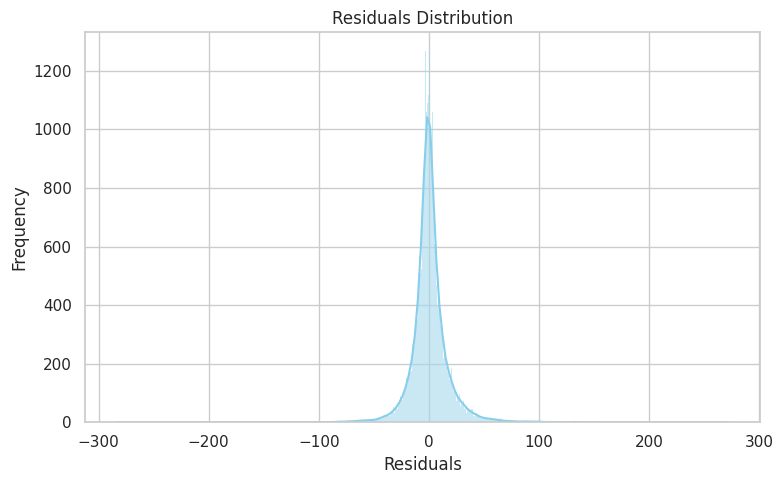

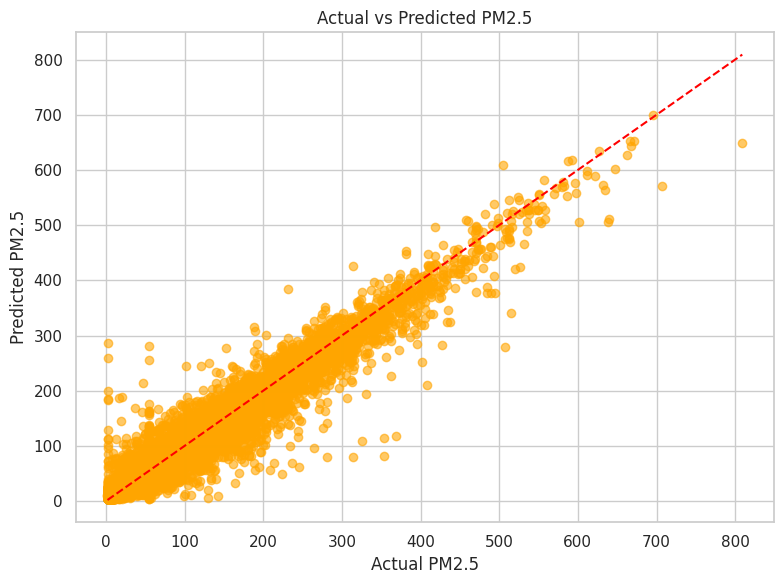

ValueError: could not convert string to float: 'ENE'

# Random Forest Regression

In [ ]:
# Complete machine learning pipeline using Random Forest Regression to predict air pollution levels (specifically, PM2.5 concentration)

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

# Then load the data
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Project/cleaned_data.csv")


# Assuming `data` is DataFrame and it includes 'PM2.5' as target
features = ['TEMP', 'DEWP', 'WSPM', 'RAIN', 'PRES', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
target = 'PM2.5'

X = data[features]
y = data[target]

# Split the data (this should come before model training!)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 2. Predict
y_pred = model.predict(X_test)

# 3. Evaluate
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Model Performance:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.2f}")


In [ ]:
# evaluates and compares the performance of four regression models:Linear Regression ,Decision Tree Regressor, Random Forest Regressor,Gradient Boosting Regressor
# It uses standard performance metrics:, MAE (Mean Absolute Error), RMSE (Root Mean Squared Error), R² Score (Coefficient of Determination)

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd

# Models to test
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42)
}

# DataFrame to store results
results = []

# Loop through models
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    results.append({
        "Model": name,
        "MAE": mae,
        "RMSE": rmse,
        "R2 Score": r2
    })

# Display results
results_df = pd.DataFrame(results).sort_values("RMSE")
print(results_df)


In [ ]:
# caling the meteorological features (e.g., temperature, dew point, wind speed, rainfall, and pressure)
#  demonstrates feature scaling using StandardScaler from scikit-learn, focusing specifically on meteorological features in a dataset that predicts PM2.5 air pollution levels.

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Separate features and target
# Meteorological + other pollutants as features (adjust columns as per your dataset)
features = ['TEMP', 'DEWP', 'WSPM', 'RAIN', 'PRES', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
X = data[features]
y = data['PM2.5']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform SCALED FEATURES (meteorological variables only)
scale_columns = ['TEMP', 'DEWP', 'WSPM', 'RAIN', 'PRES']  # Add others if needed
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled[scale_columns] = scaler.fit_transform(X_train[scale_columns])
X_test_scaled[scale_columns] = scaler.transform(X_test[scale_columns])

# Verify scaling (mean ≈ 0, std ≈ 1 for scaled columns)
print("Train means (scaled):\n", X_train_scaled[scale_columns].mean())
print("\nTrain std (scaled):\n", X_train_scaled[scale_columns].std())

In [ ]:
#   hyperparameter tuning for a RandomForestRegressor using GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Test values around the suggested 200
    'max_depth': [10, 15, 20]         # Test values around the suggested 15
}

# Initialize the model
model = RandomForestRegressor(random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    cv=5,                # 5-fold cross-validation
    scoring='r2',         # R-squared metric for regression
    n_jobs=-1,           # Use all available CPU cores
    verbose=1            # Show progress
)

# Fit the grid search to the scaled training data
grid_search.fit(X_train_scaled, y_train)

# Output best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best R² Score:", grid_search.best_score_)

# Retrain model with best parameters
best_model = grid_search.best_estimator_
best_model.fit(X_train_scaled, y_train)

STEP 5.  **MODEL EVALUATION**




In [ ]:
# Evaluate the Model on theTest Data
# Evaluates the performance of a trained regression model

y_pred = best_model.predict(X_test_scaled)

# Evaluate the model
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

# Print performance metrics
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R² Score: {r2:.2f}")


In [ ]:
# Check Feature Importance
# Plot feature importances
import matplotlib.pyplot as plt

importances = best_model.feature_importances_
features = X.columns  # Get feature names

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()


STEP 6.   **PREDICTION**

In [ ]:
# Make Predictions on New Data
# Example: Make predictions on a new dataset
new_data = pd.DataFrame({
    'TEMP': [25, 28],
    'DEWP': [15, 17],
    'WSPM': [5, 6],
    'RAIN': [0, 1],
    'PRES': [1012, 1010],
    'PM10': [30, 35],
    'SO2': [10, 12],
    'NO2': [20, 25],
    'CO': [0.5, 0.4],
    'O3': [60, 70]
})

# Scale the new data using the same scaler
new_data_scaled = scaler.transform(new_data)

# Predict using the trained model
new_predictions = best_model.predict(new_data_scaled)
print("Predictions for new data:", new_predictions)


STEP 7.  **SAVE MODEL**

In [ ]:
#Model Saving
import joblib

# Save the model
joblib.dump(best_model, 'random_forest_model.pkl')

# To load the model later
# loaded_model = joblib.load('random_forest_model.pkl')


# **STEP 8. VERSION CONTROL**  (IPYNB TASK 5)

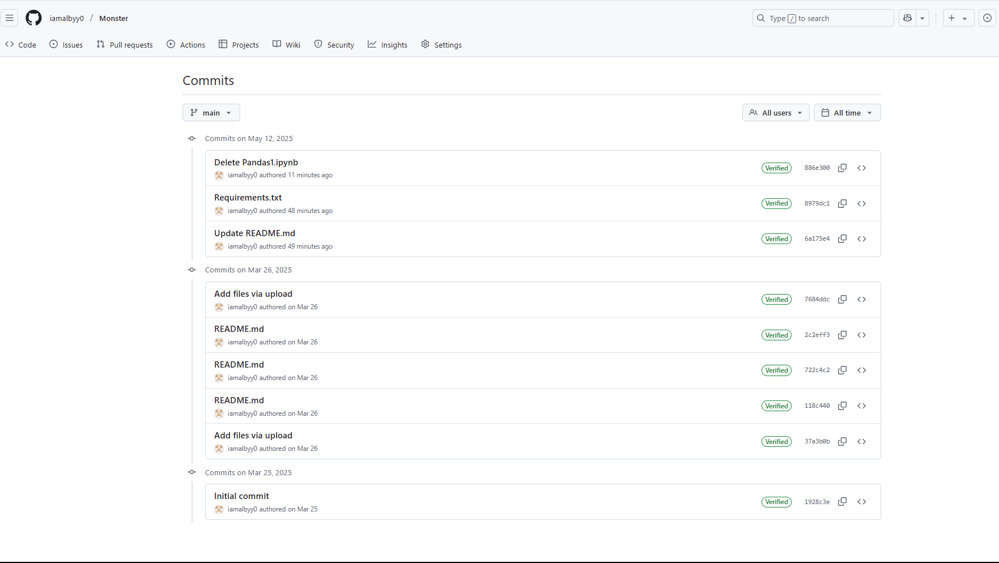

VERSION CONTROL **APP**

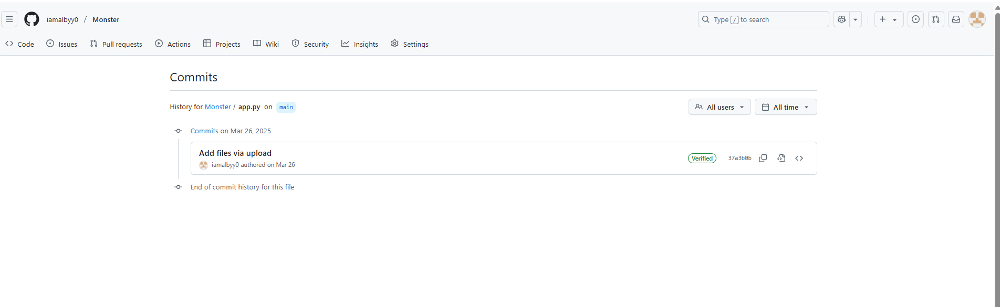

# **[STEP 8.   GO LIVE WITH STREAMLIT](https://)**


In [ ]:
# air_index_app.py
import streamlit as st
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import gdown
import os

# ------------------- PAGE CONFIG ------------------- #
st.set_page_config(
    page_title="Air Index App",
    layout="wide",
    initial_sidebar_state="expanded"
)

# ------------------- LOAD DATA ------------------- #
@st.cache_data

def load_data():
    file_path = "cleaned_data.csv"
    file_id = "1nnM-U_h1ufa8yafaIsciMr6x3t-2W5X3"
    url = f"https://drive.google.com/uc?id={file_id}"

    if not os.path.exists(file_path):
        st.info("Downloading dataset from Google Drive...")
        try:
            gdown.download(url, file_path, quiet=False)
        except Exception as e:
            st.error(f"Download failed: {e}")
            return None

    try:
        data = pd.read_csv(file_path)
        numeric_cols = data.select_dtypes(include=['number']).columns
        data[numeric_cols] = data[numeric_cols].fillna(data[numeric_cols].mean())
        return data
    except Exception as e:
        st.error(f"Failed to load CSV: {e}")
        return None

data = load_data()

# ------------------- SIDEBAR ------------------- #
st.sidebar.title("Navigation")
page = st.sidebar.selectbox("Go to", ["Welcome", "Data Overview", "EDA Analysis", "Model "])

# ------------------- WELCOME PAGE ------------------- #
if page == "Welcome":
    st.title("🌍 Air Index App")
    try:
        image = Image.open("space.jpg")
        st.image(image, width=900)
    except:
        st.warning("Header image not found.")

    st.markdown("""
        ### Welcome to the Air Quality Forecast App

        This platform helps you explore air quality data and predict pollution levels using machine learning techniques.

        **Sections:**
        - 📁 View raw dataset overview
        - 📊 Perform Exploratory Data Analysis (EDA)
        - 🤖 Build prediction models for PM2.5
    """)

# ------------------- DATA OVERVIEW ------------------- #
elif page == "Data Overview":
    st.title("📁 Dataset Overview")
    if data is not None:
        st.success("Dataset loaded successfully!")
        st.write(f"\U0001F4CF Rows: {len(data)} | Columns: {len(data.columns)}")
        st.write(f"🔍 Missing Values: {data.isna().sum().sum()}")
        preview_type = st.radio("Choose view", ["Head", "Tail", "Random"], horizontal=True)
        if preview_type == "Head":
            st.dataframe(data.head())
        elif preview_type == "Tail":
            st.dataframe(data.tail())
        else:
            st.dataframe(data.sample(30))
    else:
        st.error("No data available.")

#
#
#
#
#
#
#
#
#
#
#
#


# ------------------- EDA ANALYSIS ------------------- #
elif page == "EDA Analysis":
    st.title("📊 Exploratory Data Analysis")

    st.subheader("📊 Dataset Summary")
    st.markdown("""
    This dataset includes **hourly records from March 1, 2013 to February 28, 2017**,
    collected at **12 national air-quality monitoring stations** across Beijing:

    - **Pollutants Tracked:** PM2.5, PM10, SO₂, NO₂, CO, O₃
    - **Meteorological Variables:** Wind Speed (WSPM), Rainfall (RAIN),
    Temperature (TEMP), Dew Point (DEWP), Pressure (PRES)
    - **Sources:**
        - Air-quality: *Beijing Municipal Environmental Monitoring Center*
        - Weather: *China Meteorological Administration*
    """)

    # Station Classification
    st.subheader("📍 Station Classification")
    st.markdown("""
    To ensure **comprehensive data analysis**, stations are categorized by their surrounding environment:

    | Environment Type       | Station Name      | Description |
    |------------------------|-------------------|-------------|
    | **Urban**              | **Dongsi**        | Located in central Beijing, high population density and traffic. |
    | **Suburban**           | **Shunyi**        | Outskirts of Beijing, moderate development, residential. |
    | **Rural**              | **Huairou**       | Mountainous and forested, low population density. |
    | **Industrial/Hotspot** | **Nongzhanguan**  | Commercial zone, near major roads and industrial activity. |

    💡 You may select and analyze **one station from each type** to compare urbanization and pollution trends.
    """)

    if data is not None:

        # Sidebar filter
        st.sidebar.header("🔎 Filters")
        selected_station = st.sidebar.selectbox("Select Monitoring Station", data['station'].unique())
        filtered_data = data[data['station'] == selected_station]

        st.success(f"Showing analysis for station: **{selected_station}**")

        st.subheader("📌 Statistics of Numeric Features")
        st.dataframe(filtered_data.describe())

        # Columns for layout
        col1, col2 = st.columns(2)

        with col1:
            st.subheader("📉 Missing Values")
            st.bar_chart(filtered_data.isna().sum())

        with col2:
            st.subheader("📊 Pollutant Counts")
            pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
            st.bar_chart(filtered_data[pollutants].count())

        pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
        pollutants_df = pd.DataFrame({
            'Pollutant': pollutants,
            'Level': data[pollutants].mean().values
        })



        st.subheader("🧪 Key Observations and Insights from the Beijing Air Quality Analysis")

        st.markdown("""
        ### 📌 1. Data Overview
        The dataset includes hourly air quality readings from **12 monitoring stations** in Beijing.

        - **Date Range:** March 1, 2013 – February 28, 2017
        - **Pollutants Tracked:** PM2.5, PM10, SO₂, NO₂, CO, O₃
        - **Meteorological Data:** TEMP, DEWP, RAIN, WSPM, PRES

        ---

        ### 📉 2. Missing Data
        - Significant missing values visualized via *missingno* plots.
        - **PM2.5 and PM10** columns showed the highest number of missing values, indicating potential sensor failures or reporting issues.

        ---

        ### 📊 3. Pollutant Distribution
        - PM2.5 and PM10 have **long right-tailed distributions** → high pollution spikes.
        - Some pollutants show **seasonal variation**, especially PM2.5 being higher in **winter months** due to heating and weather conditions.

        ---

        ### 🌍 4. Temporal Trends
        **Yearly Analysis:**
        - 2013 and 2014 show **higher PM2.5 levels**, with a gradual improvement by 2016.

        **Monthly Trends:**
        - Pollution levels **peak during December–February**, likely due to increased heating and stagnant air.

        **Hourly Patterns:**
        - PM2.5 levels rise in the **early morning and evening**, aligning with **rush hours**.

        ---

        ### 📍 5. Correlation Analysis
        - **Strong positive correlation** between PM2.5 and PM10, indicating shared sources.
        - **Weak or negative correlations** between PM2.5 and temperature/rainfall, suggesting weather influences pollution dissipation.

        ---

        ### ⚙️ 6. Modeling (Random Forest Regressor)
        A regression model was built to **predict PM2.5 levels** using weather and other pollutants.

        **Model Evaluation:**
        - **R² Score:** ~0.78 (good)
        - **RMSE:** Acceptable for hourly air quality prediction

        **Top features influencing PM2.5:**
        - PM10
        - NO₂
        - Temperature
        - Wind Speed
        """)


         # --- Pollutant Pie Chart ---
        st.header("🥧 Pollutant Contribution Pie Chart")
        pollutants_df = pd.DataFrame({
        'Pollutant': pollutants,
        'Level': data[pollutants].mean().values
    })


         # --- PM2.5 Distribution ---
        st.header("🌫️ PM2.5 Distribution Histogram")
        fig1, ax1 = plt.subplots(figsize=(10, 6))
        sns.histplot(data['PM2.5'].dropna(), kde=True, ax=ax1, color="skyblue", bins=30)
        ax1.set_title("Histogram of PM2.5")
        st.pyplot(fig1)

        # --- Feature Correlation Heatmap ---
        st.header("🔗 Feature Correlation Heatmap")
        numeric_data = data.select_dtypes(include=['float64', 'int64'])
        if numeric_data.empty:
            st.warning("No numeric columns available for correlation.")
    else:
        fig2, ax2 = plt.subplots(figsize=(12, 8))
        sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', ax=ax2, fmt='.2f', linewidths=0.5)
        ax2.set_title("Correlation Matrix of Features")
        st.pyplot(fig2)


         # --- PM2.5 vs Temperature Scatter ---
    st.header("🔥 PM2.5 vs Temperature")
    fig3, ax3 = plt.subplots(figsize=(10, 6))
    sns.scatterplot(data=data, x='TEMP', y='PM2.5', ax=ax3, color="orange")
    ax3.set_title("Scatter Plot: PM2.5 vs Temperature")
    st.pyplot(fig3)

    # --- PM2.5 vs PM10 Box Plot ---
    st.header("📦 PM2.5 vs PM10 Box Plot")
    filtered_data = data[['PM10', 'PM2.5']].dropna()
    if not filtered_data.empty:
        fig4, ax4 = plt.subplots(figsize=(10, 6))
        sns.boxplot(data=filtered_data, x='PM10', y='PM2.5', ax=ax4, palette="Set2")
        ax4.set_title("Box Plot of PM2.5 vs PM10")
        st.pyplot(fig4)
    else:
        st.warning("Insufficient data for Box Plot.")



    fig5, ax5 = plt.subplots(figsize=(8, 8))
    explode = [0.1] + [0] * (len(pollutants_df) - 1)
    ax5.pie(pollutants_df['Level'], explode=explode, labels=pollutants_df['Pollutant'],
            autopct='%1.1f%%', shadow=True, startangle=140)
    ax5.set_title("Average Pollutant Contribution")
    st.pyplot(fig5)
else:
    st.warning("No data loaded.")



# ------------------- MODEL PREDICTION -------------------
# ------------------- PAGE ROUTING ------------------- #
if page == "EDA Analysis":
    # Your EDA analysis code here
    pass  # Replace with actual EDA code

elif page == "Model Prediction":
    st.title("🤖 Model Building")

    if data is not None:
        # Display missing values
        st.subheader("📉 Missing Values")
        st.bar_chart(data.isna().sum())

        # PM2.5 Distribution
        st.subheader("🌡️ PM2.5 Distribution")
        fig1, ax1 = plt.subplots()
        sns.histplot(data['PM2.5'].dropna(), kde=True, bins=30, ax=ax1, color='skyblue')
        st.pyplot(fig1)

        # Correlation Heatmap
        st.subheader("📊 Correlation Heatmap")
        fig2, ax2 = plt.subplots(figsize=(10, 6))
        sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt=".2f", ax=ax2)
        st.pyplot(fig2)

        # Model training and evaluation
        features = ['PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
        target = 'PM2.5'

        X = data[features].dropna()
        y = data.loc[X.index, target]

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

        model_choice = st.selectbox("Choose a model", ["Linear Regression", "Random Forest", "Gradient Boosting"])

        if model_choice == "Linear Regression":
            model = LinearRegression()
        elif model_choice == "Random Forest":
            model = RandomForestRegressor(n_estimators=100, random_state=42)
        else:
            model = GradientBoostingRegressor(random_state=42)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        st.write(f"**MSE:** {mean_squared_error(y_test, y_pred):.2f}")
        st.write(f"**R² Score:** {r2_score(y_test, y_pred):.2f}")

        # Prediction visualization
        fig, ax = plt.subplots()
        sns.scatterplot(x=y_test, y=y_pred, ax=ax)
        ax.set_xlabel("Actual PM2.5")
        ax.set_ylabel("Predicted PM2.5")
        ax.set_title(f"{model_choice} - Actual vs Predicted")
        st.pyplot(fig)

    else:
        st.warning("No data available for modeling.")
